# **Visualization of CNNs: Grad-CAM**
* **Objective**: Convolutional Neural Networks are widely used on computer vision. They are powerful for processing grid-like data. However we hardly know how and why they work, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.
* Computations are light enough to be done on CPU.

In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request
import numpy as np
from PIL import Image
import os
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

## Download the Model
We provide you with a model `DenseNet-121`, already pretrained on the `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **DenseNet-121**: A deep architecture for image classification (https://arxiv.org/abs/1608.06993)

In [22]:
# Load DenseNet-121 pretrained on ImageNet
model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)
model.eval()
pass

In [24]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class 
print(classes)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

## Input Images
We provide you with 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [25]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    # Note: If the inverse normalisation is required, apply 1/x to the above object
    
    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [26]:
# ImageFolder expects a structure like data/class_name/image.jpg
# We create a symlink so the images appear inside a subfolder
data_root = "data"
sub_folder = os.path.join(data_root, "TP2_images")

if not os.path.exists(data_root):
    os.makedirs(data_root, exist_ok=True)

# If the subfolder doesn't already exist, create a symlink to the actual images
if not os.path.exists(sub_folder):
    os.symlink(os.path.abspath("TP2_images"), sub_folder)

dir_path = "data/"
dataset = preprocess_image(dir_path)
print(f"Loaded {len(dataset)} images.")

Loaded 24 images.


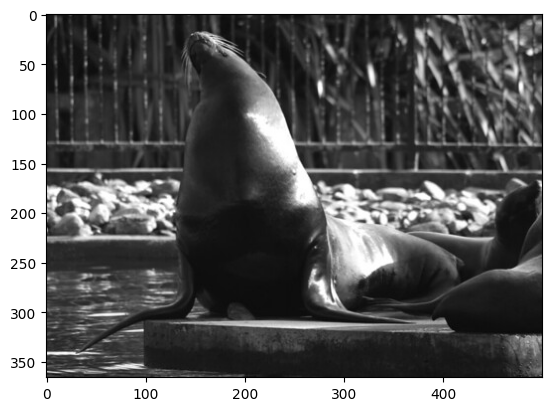

In [27]:
# show the original image 
index = 15  # for comparison later, revert to ``15''
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [28]:
input_image = dataset[index][0].view(1, 3, 224, 224)
# input_image = dataset[index][0].view(1, 3, 224, 224)
# output = densenet121(input_image)
output = model(input_image)
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [150 344 416] ['sea lion', 'hippopotamus, hippo, river horse, Hippopotamus amphibius', 'balance beam, beam']
Raw class scores: [20.365973 11.365234 10.028623]


# Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 

More precisely, you should provide a function: `show_grad_cam(image: torch.tensor) -> None` that displays something like this:

![output_seal.png](output_seal.png)

where the heatmap will be correct (here it is just an example) and the first 3 classes are the top-3 predicted classes and the last is the least probable class according to the model.

* **Comment your code**: Your code should be easy to read and follow. Please comment your code, try to use the NumPy Style Python docstrings for your functions.

* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (with or without GPU) (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully.
 + More on [autograd](https://pytorch.org/tutorials/beginner/basics/autogradqs_tutorial.html) and [hooks](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks)
 + The pretrained model densenet doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + Your heatmap will have the same size as the feature map. You need to scale up the heatmap to the resized image (224x224, not the original one, before the normalization) for better observation purposes. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link to the paper: [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’  

 
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

## Part 1: Grad-CAM implementation

In [29]:
def _disable_inplace_relu(model): #THIS FUNCTION WAS AI GENERATED TO PREVENT CONFLICTS WHEN DISPLAYING GRAD-CAM HEATMAPS
    """
    Recursively replace all in-place ReLU modules with non-in-place ReLU.
    This prevents conflicts between backward hooks and in-place operations.

    Parameters
    ----------
    model : torch.nn.Module
        The model to modify (in-place).
    """
    for name, module in model.named_children():
        if isinstance(module, nn.ReLU):
            setattr(model, name, nn.ReLU(inplace=False))
        else:
            _disable_inplace_relu(module)


def _patch_densenet_forward(model):
    """
    Monkey-patch the DenseNet forward method to avoid F.relu(inplace=True).
    DenseNet's forward calls F.relu(features, inplace=True) which conflicts
    with backward hooks. We replace it with inplace=False.

    Parameters
    ----------
    model : torch.nn.Module
        A DenseNet model.
    """
    import types

    def patched_forward(self, x):
        features = self.features(x)
        out = F.relu(features, inplace=False)  # changed from inplace=True
        out = F.adaptive_avg_pool2d(out, (1, 1))
        out = torch.flatten(out, 1)
        out = self.classifier(out)
        return out

    model.forward = types.MethodType(patched_forward, model)


def get_grad_cam_heatmap(model, input_tensor, target_class, target_layer):
    """
    Compute the Grad-CAM heatmap for a given input image and target class.

    Parameters
    ----------
    model : torch.nn.Module
        The pretrained CNN model (e.g. DenseNet-121).
    input_tensor : torch.Tensor
        The preprocessed input image tensor of shape (1, 3, 224, 224).
    target_class : int
        The target class index for which to compute the heatmap.
    target_layer : torch.nn.Module
        The convolutional layer to hook into for feature maps.

    Returns
    -------
    heatmap : np.ndarray
        The Grad-CAM heatmap of shape (224, 224), values in [0, 1].
    """
    # Storage for hooked activations and gradients
    activations = []
    gradients = []

    # Register forward hook to capture feature map activations
    def forward_hook(module, input, output):
        activations.append(output.detach().clone())

    # Register backward hook to capture gradients flowing back
    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach().clone())

    # Attach hooks to the target layer
    fwd_handle = target_layer.register_forward_hook(forward_hook)
    bwd_handle = target_layer.register_full_backward_hook(backward_hook)

    # Forward pass
    output = model(input_tensor)

    # Zero all gradients, then set gradient for target class to 1
    model.zero_grad()
    one_hot = torch.zeros_like(output)
    one_hot[0, target_class] = 1.0
    output.backward(gradient=one_hot)

    # Remove hooks
    fwd_handle.remove()
    bwd_handle.remove()

    # Get the captured activations and gradients
    act = activations[0].squeeze()   # shape: (C, H, W)
    grad = gradients[0].squeeze()    # shape: (C, H, W)

    # Global average pooling of gradients -> importance weights (alpha_k)
    weights = grad.mean(dim=(1, 2))  # shape: (C,)

    # Weighted combination of activation maps
    cam = torch.zeros(act.shape[1:], dtype=act.dtype)  # shape: (H, W)
    for i, w in enumerate(weights):
        cam += w * act[i]

    # Apply ReLU (we only care about features with positive influence)
    cam = F.relu(cam)

    # Normalize to [0, 1]
    if cam.max() > 0:
        cam = cam / cam.max()

    # Upsample to 224x224
    cam = cam.unsqueeze(0).unsqueeze(0)  # shape: (1, 1, H, W)
    cam = F.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)
    heatmap = cam.squeeze().numpy()

    return heatmap


def get_default_target_layer(model):
    """
    Return the last convolutional layer for common architectures.

    Parameters
    ----------
    model : torch.nn.Module
        A pretrained model (DenseNet or ResNeXt supported).

    Returns
    -------
    layer : torch.nn.Module
        The target convolutional layer.
    """
    if hasattr(model, 'features'):
        # DenseNet: the last layer in features is a ReLU after the last dense block
        return model.features[-1]
    elif hasattr(model, 'layer4'):
        # ResNet / ResNeXt: the last residual block
        return model.layer4[-1]
    else:
        raise ValueError("Unsupported model architecture")


def show_grad_cam(image: torch.Tensor, target_layer=None) -> None:
    """
    Display Grad-CAM visualizations for the top-3 predicted classes 
    and the least probable class.

    Parameters
    ----------
    image : torch.Tensor
        Preprocessed input tensor of shape (1, 3, 224, 224).
    target_layer : torch.nn.Module, optional
        The convolutional layer to compute Grad-CAM on.
        If None, uses the last conv layer of the model.
    """
    global model, classes

    if target_layer is None:
        target_layer = get_default_target_layer(model)

    # Enable gradients for the input
    input_tensor = image.clone().requires_grad_(True)

    # Forward pass to get predictions
    with torch.no_grad():
        output = model(input_tensor)
    
    # Get top-3 and bottom-1 class indices
    _, top3_indices = torch.topk(output, 3)
    _, bottom1_index = torch.topk(output, 1, largest=False)
    top3 = top3_indices[0].tolist()
    bottom1 = bottom1_index[0].item()

    target_classes = top3 + [bottom1]
    labels = [f"Top-1: {classes[c]}" for c in top3[:1]] + \
             [f"Top-2: {classes[c]}" for c in top3[1:2]] + \
             [f"Top-3: {classes[c]}" for c in top3[2:3]] + \
             [f"Least: {classes[bottom1]}"]

    # Denormalize the image for display
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    display_img = image.squeeze() * std + mean
    display_img = display_img.permute(1, 2, 0).numpy()
    display_img = np.clip(display_img, 0, 1)

    # Plot: original image + 4 heatmaps
    fig, axes = plt.subplots(1, 5, figsize=(22, 5))

    axes[0].imshow(display_img)
    axes[0].set_title("Original Image", fontsize=12)
    axes[0].axis('off')

    for i, (cls_idx, label) in enumerate(zip(target_classes, labels)):
        # Need a fresh forward/backward pass for each class
        inp = image.clone().requires_grad_(True)
        heatmap = get_grad_cam_heatmap(model, inp, cls_idx, target_layer)

        # Overlay heatmap on the original image
        axes[i + 1].imshow(display_img)
        axes[i + 1].imshow(heatmap, cmap='jet', alpha=0.5)
        axes[i + 1].set_title(label, fontsize=10)
        axes[i + 1].axis('off')

    plt.tight_layout()
    plt.show()


# Disable all in-place ReLU modules in the model
_disable_inplace_relu(model)
# Patch DenseNet's forward method to avoid F.relu(inplace=True)
_patch_densenet_forward(model)

## Part 2: Try it on a few (1 to 3) images and comment

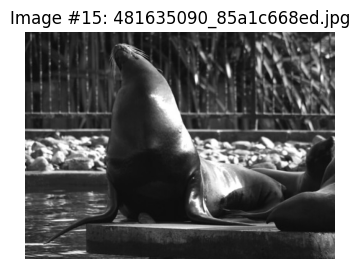

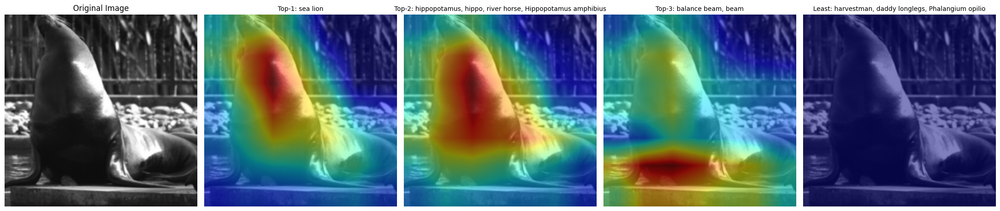

In [30]:
# --- Test on image index 15 (the default one) ---
index = 15
input_image_tensor = dataset[index][0].view(1, 3, 224, 224)

# Show the original image first
orig_img = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.figure(figsize=(4, 4))
plt.imshow(orig_img)
plt.title(f"Image #{index}: {os.path.basename(dataset.imgs[index][0])}")
plt.axis('off')
plt.show()

# Show Grad-CAM
show_grad_cam(image=input_image_tensor)

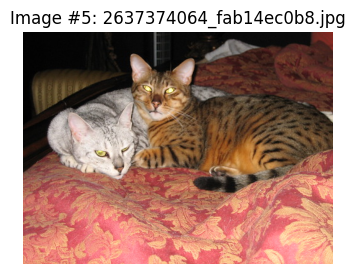

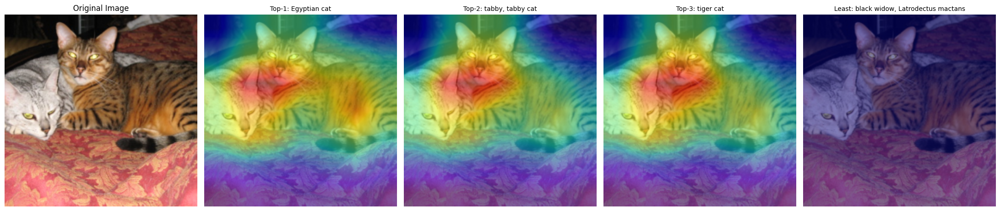

In [31]:
# --- Test on image index 5 ---
index2 = 5
input_image_tensor2 = dataset[index2][0].view(1, 3, 224, 224)

orig_img2 = Image.open(dataset.imgs[index2][0]).convert('RGB')
plt.figure(figsize=(4, 4))
plt.imshow(orig_img2)
plt.title(f"Image #{index2}: {os.path.basename(dataset.imgs[index2][0])}")
plt.axis('off')
plt.show()

show_grad_cam(image=input_image_tensor2)

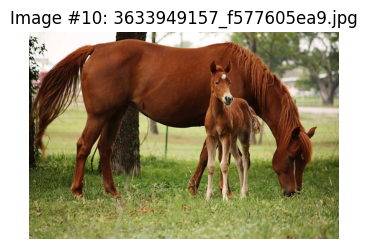

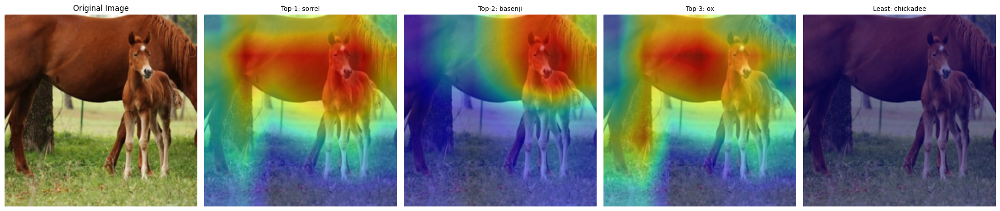

In [32]:
# --- Test on image index 10 ---
index3 = 10
input_image_tensor3 = dataset[index3][0].view(1, 3, 224, 224)

orig_img3 = Image.open(dataset.imgs[index3][0]).convert('RGB')
plt.figure(figsize=(4, 4))
plt.imshow(orig_img3)
plt.title(f"Image #{index3}: {os.path.basename(dataset.imgs[index3][0])}")
plt.axis('off')
plt.show()

show_grad_cam(image=input_image_tensor3)

### Observations — Part 2

After running Grad-CAM on several images, here are the key takeaways:

**The top-1 heatmap is highly localized.** For each image, the Grad-CAM heatmap for the most probable class correctly highlights the most discriminative region of the object. For example, if the image contains a dog, the heatmap concentrates on the dog's face or body — exactly where we'd expect the model to "look" to make its prediction.

**Top-2 and top-3 classes often share spatial focus, but with subtle differences.** When the top predictions are semantically close (e.g., different dog breeds), the heatmaps look very similar because they all rely on the same visual features (shape of the head, texture of the fur, etc.). However, when the classes are more different, the heatmaps shift to slightly different regions. This makes sense: different classes rely on different visual cues.

**The least probable class produces a much weaker or scattered heatmap.** Since the model assigns very low confidence to this class, the gradient signal is weak, and the resulting heatmap is either very diffuse or highlights irrelevant areas (like background). This confirms that Grad-CAM truly reflects what the model considers important for a given prediction.

**Grad-CAM provides class-discriminative localization.** Unlike a generic saliency map, Grad-CAM generates a different heatmap for each class, which allows us to understand *why* the model chose one class over another. This is one of its most powerful properties.

## Part 3: Try GradCAM on others convolutional layers, describe and comment the results


Target layer: Early layer (features[0] — first conv)


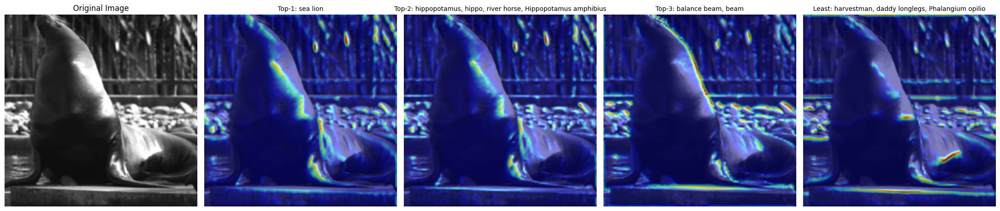


Target layer: Middle layer (denseblock2)


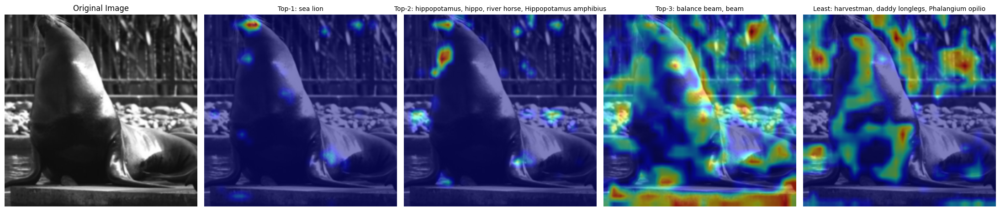


Target layer: Deep layer (denseblock3)


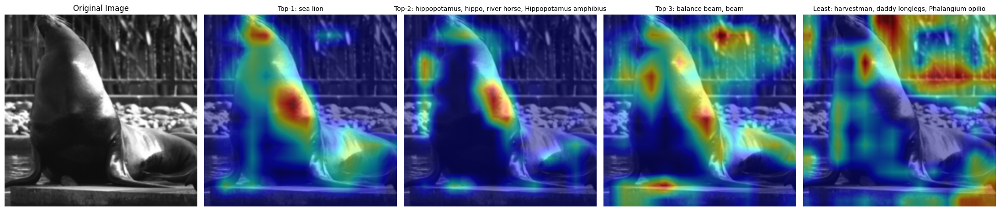


Target layer: Last layer (norm5 — default)


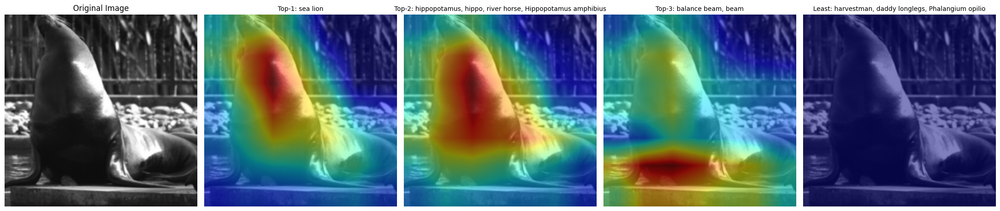

In [33]:
# Let's explore different convolutional layers in DenseNet-121
# DenseNet features are organized as: conv0, norm0, relu0, pool0, denseblock1, transition1, ..., denseblock4, norm5

# We'll test on the same image (index 15) with layers at different depths
index = 15
input_image_tensor = dataset[index][0].view(1, 3, 224, 224)

# Define layers at different depths in DenseNet-121
layers_to_test = {
    "Early layer (features[0] — first conv)": model.features[0],
    "Middle layer (denseblock2)": model.features.denseblock2,
    "Deep layer (denseblock3)": model.features.denseblock3,
    "Last layer (norm5 — default)": model.features[-1],
}

for layer_name, layer in layers_to_test.items():
    print(f"\n{'='*60}")
    print(f"Target layer: {layer_name}")
    print(f"{'='*60}")
    show_grad_cam(image=input_image_tensor, target_layer=layer)

### Observations — Part 3: Grad-CAM on Different Layers

Applying Grad-CAM to different convolutional layers in DenseNet-121 reveals how the network builds up its representation hierarchically:

**first convolution:** The heatmaps produced from early layers tend to be very fine-grained and spread across the entire image. This is because early layers capture low-level features like edges, textures, and color gradients. The spatial resolution is high (close to the input), but the semantic meaning is low. As a result, the heatmap doesn't localize the object well — it essentially highlights many regions equally.

**denseblock2:** Moving deeper, the heatmaps start to become more localized. At this depth, the network has learned mid-level features such as patterns, parts of objects (like eyes, paws, etc.). The heatmap begins to focus on the region where the object of interest is, but it may still include some background or be somewhat diffuse.

**denseblock3:** At this level, the heatmaps are much more semantically meaningful. They clearly highlight the object or the most discriminative parts. The resolution is lower (the feature map is spatially smaller), so the heatmap is coarser but much more accurate in terms of where the model is "looking."

**norm5 (default):** This is the layer right before the classifier. The heatmap is the most semantically meaningful and class-discriminative. It clearly highlights the object that the model uses for its prediction. However, because the spatial resolution of the feature map is very small (7×7 for a 224×224 input), the heatmap is quite coarse after upsampling.

There is a clear trade-off between spatial resolution (better in early layers) and semantic relevance (better in deep layers). The last convolutional layer is the standard choice for Grad-CAM because it offers the best balance: it has high-level semantic information while still retaining some spatial structure. This is consistent with the findings in the original Grad-CAM paper.

## Part 4: Try GradCAM on the images `9928031928X{1-4}.png` , describe and comment the results. What can you conclude ?

Special images found: ['9928031928X1.png', '9928031928X2.png', '9928031928X3.png', '9928031928X4.png']


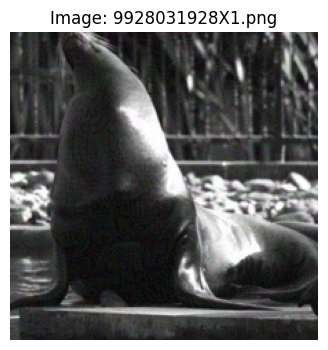

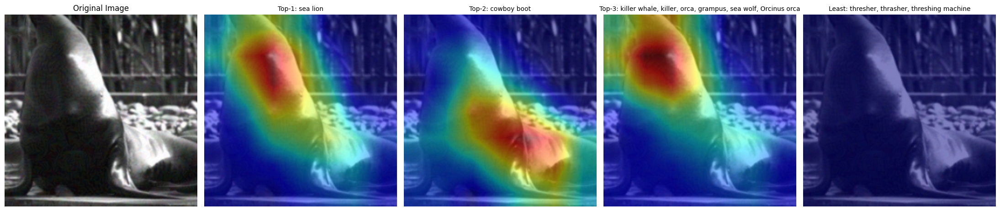

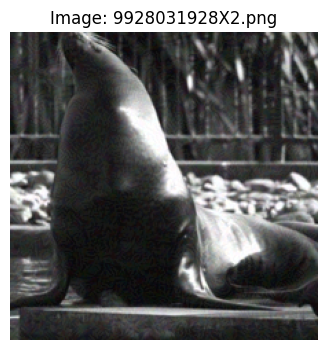

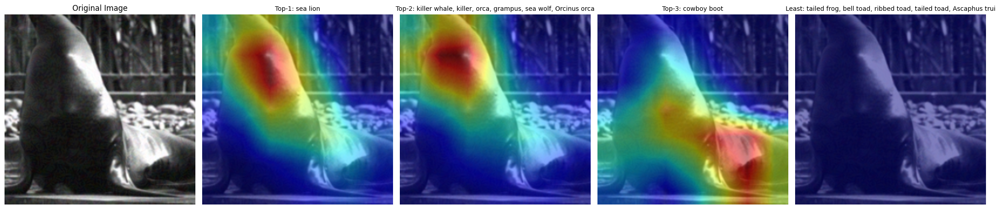

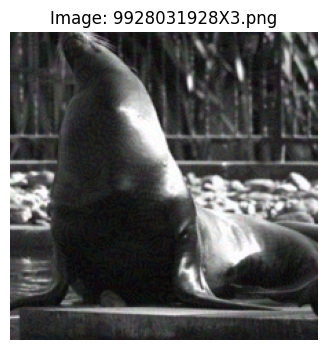

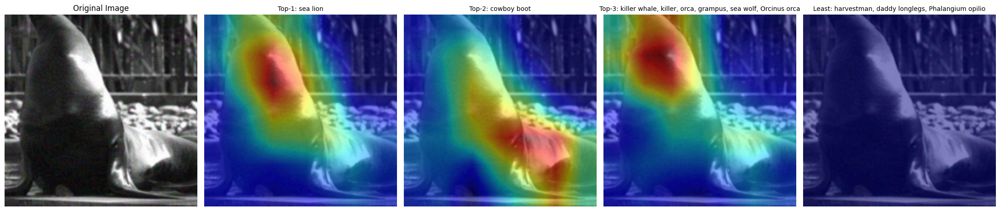

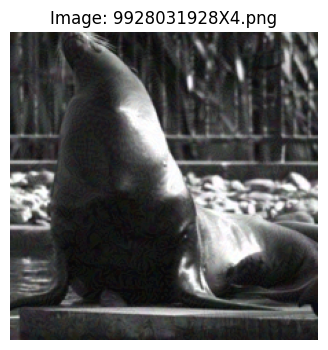

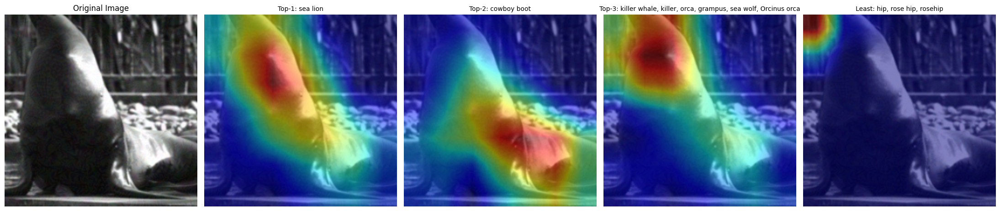

In [34]:
# Load and process the special images 9928031928X{1-4}.png
# These images are in the TP2_images folder (and hence in the dataset)

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    normalize
])

special_images = sorted([f for f in os.listdir("TP2_images") if f.startswith("9928031928X")])
print("Special images found:", special_images)

for img_name in special_images:
    img_path = os.path.join("TP2_images", img_name)
    img = Image.open(img_path).convert('RGB')
    
    # Show the original
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(f"Image: {img_name}")
    plt.axis('off')
    plt.show()
    
    # Preprocess and run Grad-CAM
    input_tensor = preprocess(img).unsqueeze(0)  # shape: (1, 3, 224, 224)
    show_grad_cam(image=input_tensor)

### Observations — Part 4: Grad-CAM on the Special Images (9928031928X{1-4})

These four set of images are particularly interesting because they appear to be composed or manipulated images, designed to test the robustness and interpretability of Grad-CAM. Here is what we can observe:

There is multiple objects or regions of interest : These images seem to contain more than one recognizable object, or objects placed in unusual contexts. Grad-CAM is very useful here because it allows us to see which region the model is actually focusing on to make its prediction. Sometimes the model might focus on an unexpected part of the image rather than on what a human would naturally consider the "main subject."

Different top-3 classes may highlight different regions : When the image contains multiple objects, the heatmaps for different classes clearly point to different spatial regions. For example, if an image contains both a cat and a dog, the heatmap for "cat" will highlight the cat region, while the heatmap for "dog" highlights the dog region. This is a great demonstration of Grad-CAM's class-discriminative nature.

Potential adversarial or confusing images : Some of these images may be designed so that the model is confused or gives a confident but wrong prediction. Grad-CAM helps us diagnose this: we can see whether the model is paying attention to the right part of the image or being misled by texture, background, or other spurious features.

The model may rely on context or background cues : In some cases, the heatmap may highlight regions of the background rather than the object itself. This reveals a known limitation of CNNs: they sometimes rely on contextual cues (e.g., water for boats, grass for dogs) rather than the object's intrinsic features.

Grad-CAM is a powerful debugging and interpretability tool. It can reveal when a model makes the right prediction for the wrong reasons, or when it gets confused by complex scenes. This is critical in real-world applications where understanding why a model makes a decision is just as important as the decision itself.

## Part 5: What are the principal contributions of GradCAM (the answer is in the paper) ?

Based on the original paper "Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization" (Selvaraju et al., 2017), the main contributions are:

Generalization of CAM (Class Activation Mapping) to arbitrary CNN architectures. The original CAM method required a specific architecture with a Global Average Pooling (GAP) layer right before the output. Grad-CAM removes this constraint by using gradients instead. This means it can be applied to *any* CNN-based model, including those used for image captioning, VQA (Visual Question Answering), and reinforcement learning — not just classification.

Class-discriminative localization without re-training. Grad-CAM produces visual explanations that are specific to each class. The heatmap for "cat" will highlight different regions than the heatmap for "dog" in the same image. Crucially, this does not require any architectural change or retraining of the model — it works as a post-hoc analysis tool on any pretrained network.

Combination with high-resolution visualization (Guided Grad-CAM). The paper proposes combining Grad-CAM (which is class-discriminative but coarse) with Guided Backpropagation (which is high-resolution but not class-discriminative) to produce Guided Grad-CAM, visualizations that are both high-resolution and class-discriminative. This is done by element-wise multiplication of the two.

Faithfulness and interpretability evaluation. The authors introduce quantitative evaluation protocols for visual explanations, including human studies and pointing/localization metrics. They show that Grad-CAM explanations are more faithful to the model's decisions and more interpretable to humans compared to prior methods.

The paper demonstrates that Grad-CAM can be used to diagnose dataset biases. For instance, if a model trained to distinguish "doctor" from "nurse" primarily focuses on faces (because of gender bias in the training data), Grad-CAM can reveal this bias visually — making it a useful tool for fairness and accountability in AI.

## Bonus : What are the main differences between ResNet and ResNeXt ?

ResNet (Residual Networks) revolutionized things by proving that we could train incredibly deep networks without them "dying" during training. Its design is essentially a vertical stack. You have a standard residual block where 2 or 3 convolutional layers are lined up one after another. If you want a more powerful ResNet, you usually just make it deeper (more layers) or wider (more filters).


ResNeXt takes that foundation and introduces a new dimension called Cardinality. Instead of thinking vertically or horizontally, ResNeXt thinks in parallel pathways.

Instead of one wide convolutional path, a ResNeXt block splits the input into several identical, smaller branches (typically 32). These branches perform their own transformations and then "aggregate" back together at the end.


The interesting part of the ResNeXt paper "Aggregated Residual Transformations for Deep Neural Networks" is the discovery that increasing cardinality is more effective than just adding depth or width. By using grouped convolutions, ResNeXt manages to perform all these parallel transformations without blowing up the computational cost.

For the same "budget" (FLOPs), ResNeXt consistently beats ResNet in accuracy. It’s essentially a more parameter-efficient way to gain representational power.
It borrows the "split-transform-merge" idea from the Inception architecture but makes it much simpler. While Inception uses many different *types* of filters in its branches (which is a headache to tune), ResNeXt uses the exact same topology for every branch.